# NSF Awards & Political Interference

Analysis of how politics may interfere with the type and amount of awards given by the NSF to researchers

Note on GitHub syncing: Using Colab with GitHub is NOT like RMarkdown files and GitHub Desktop. To "push" changes to GitHub, I must do the following steps...
1. File > Save a copy in GitHub
2. Choose the reu_nsf repository
3. Write a commit message
4. Click "OK" when ready to commit the changes.

TF-IDF scores, if significant differences from year to year, show that researchers were forced to change their wording. Topic modeling *could* show that there were actual differences in topics.


#### DONT HAVE THIS DATA YET so this cell doesnt get run and is saved as text

#### 2015
awards_2015 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2015.csv", encoding='latin1')

#### 2014
awards_2014 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2014.csv", encoding='latin1')

#### 2013
awards_2013 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2013.csv", encoding='latin1')

#### 2012
awards_2012 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2012.csv", encoding='latin1')

#### 2011
awards_2011 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2011.csv", encoding='latin1')

#### 2010
awards_2010 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2010.csv", encoding='latin1')

#### 2009
awards_2009 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2009.csv", encoding='latin1')

#### 2008
awards_2008 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2008.csv", encoding='latin1')

#### 2007
awards_2007 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2007.csv", encoding='latin1')

#### 2006
awards_2006 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2006.csv", encoding='latin1')

#### 2005
awards_2005 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2005.csv", encoding='latin1')

#### 2004
awards_2004 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2004.csv", encoding='latin1')

#### 2003
awards_2003 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2003.csv", encoding='latin1')

#### 2002
awards_2002 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2002.csv", encoding='latin1')

#### 2001
awards_2001 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2001.csv", encoding='latin1')

#### 2000
awards_2000 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2000.csv", encoding='latin1')

In [1]:
# Install required packages
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.stats import mannwhitneyu
from tqdm import tqdm

In [2]:
import nltk
import os
import pickle
from nltk.tokenize import TreebankWordTokenizer

# Define your text
text = "This is a test sentence."

# Path to punkt pickle file
nltk_data_path = '/Users/ryanseely/nltk_data'
punkt_path = os.path.join(nltk_data_path, 'tokenizers', 'punkt', 'english.pickle')

# Load sentence tokenizer manually from file
with open(punkt_path, 'rb') as f:
    sentence_tokenizer = pickle.load(f)

# Tokenize
sentences = sentence_tokenizer.tokenize(text)
word_tokenizer = TreebankWordTokenizer()
tokens = [word_tokenizer.tokenize(sent) for sent in sentences]

# Flatten token list
flat_tokens = [token for sublist in tokens for token in sublist]
print(flat_tokens)

# WE HAVE TO MANUALLY CREATE work_tokerize()

def word_tokenize_manual(text):
    # Path to your punkt file
    nltk_data_path = '/Users/ryanseely/nltk_data'
    punkt_path = os.path.join(nltk_data_path, 'tokenizers', 'punkt', 'english.pickl‌​e')

    # Load sentence tokenizer manually
    with open(punkt_path, 'rb') as f:
        sentence_tokenizer = pickle.load(f)

    # Tokenize into sentences
    sentences = sentence_tokenizer.tokenize(text)

    # Tokenize into words using TreebankWordTokenizer
    word_tokenizer = TreebankWordTokenizer()
    tokens = [word_tokenizer.tokenize(sent) for sent in sentences]

    # Flatten and return token list
    return [token for sublist in tokens for token in sublist]

['This', 'is', 'a', 'test', 'sentence', '.']


In [3]:
def word_tokenize_manual(text):
    sentences = sentence_tokenizer.tokenize(text)
    return [token for sent in sentences for token in word_tokenizer.tokenize(sent)]

In [4]:
word_tokenize_manual("My name is Ryan Seely. I am a software engineer. I love coding and data science.")
# Example usage

['My',
 'name',
 'is',
 'Ryan',
 'Seely',
 '.',
 'I',
 'am',
 'a',
 'software',
 'engineer',
 '.',
 'I',
 'love',
 'coding',
 'and',
 'data',
 'science',
 '.']

# NEXT STEPS

- make pipeline, fix text processing
- pull in other years of NSF data, make the NSF data from this year and last year longer
- find the tf-idf differences
- compare the distributions of the year to year differences and choose a test
- run the appropriate statistical tests
- make graphics

# Pulling in data, adding year variable

In [5]:
# Pulling in data pipeline and getting basics on it

# want
# jan 21-mar 21 of every year since 2000

# 2025 #
awards_2025 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2025.csv", encoding='latin1')

# 2024 #
awards_2025 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2025.csv", encoding='latin1')

# 2023 #
awards_2023 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2023.csv", encoding='latin1')

# 2022
awards_2022 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2022.csv", encoding='latin1')

# 2021
awards_2021 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2021.csv", encoding='latin1')

# 2020
awards_2020 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2020.csv", encoding='latin1')

# 2019
awards_2019 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2019.csv", encoding='latin1')

# 2018
awards_2018 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2018.csv", encoding='latin1')

# 2017
awards_2017 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2017.csv", encoding='latin1')

# 2016
awards_2016 = pd.read_csv("https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_2016.csv", encoding='latin1')



In [6]:
# Build pipeline that imports data from year of ranges from github and add a year string variable to each observation for each year, then makes each year its own dataframe

def load_awards_data(start_year=2016, end_year=2025):
    awards_data = {}

    base_url = "https://raw.githubusercontent.com/ryanpseely/reu_nsf/main/awards_{}.csv"

    for year in range(start_year, end_year + 1):
        try:
            url = base_url.format(year)
            df = pd.read_csv(url, encoding='latin1')
            df['Year'] = str(year)  # Add year column as string
            awards_data[str(year)] = df
        except Exception as e:
            print(f"❌ Failed to load {year}: {e}")

    return awards_data

def create_yearly_award_variables(awards_data):
    for year, df in awards_data.items():
        globals()[f"awards_{year}"] = df

In [7]:
# run the import data pipeline
awards_data = load_awards_data(start_year=2016, end_year=2025)
create_yearly_award_variables(awards_data)

# TF-IDF with Lemmatizing

In [8]:
# Step 1: Gather all abstracts
all_abstracts = []
for df in awards_data.values():
    all_abstracts.extend(df['Abstract'].dropna().tolist())

In [9]:
import nltk
nltk.download('punkt', force=True)
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')




from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from nltk.corpus import wordnet
from sklearn.feature_extraction.text import TfidfVectorizer
from bs4 import BeautifulSoup
import re, string, nltk

lemmatizer = WordNetLemmatizer()

# Helper to convert POS tags to WordNet format
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN  # default to noun

[nltk_data] Downloading package punkt to /Users/ryanseely/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/ryanseely/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/ryanseely/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/ryanseely/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/ryanseely/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


In [10]:
# build text processing pipeline


# ---- Text Cleaning Helpers ----
def clean_html(text):
    return BeautifulSoup(text, "html.parser").get_text()

def remove_punctuation(text):
    return text.translate(str.maketrans('', '', string.punctuation))

def remove_numbers(text):
    return re.sub(r'\d+', '', text)

def collapse_whitespace(text):
    return re.sub(r'\s+', ' ', text).strip()

def lemmatize_text(text):
    tokens = word_tokenize_manual(text)
    tagged = pos_tag(tokens)
    lemmatized = [lemmatizer.lemmatize(word, get_wordnet_pos(tag)) for word, tag in tagged]
    return ' '.join(lemmatized)

# ---- Full Preprocessing Function ----
def preprocess_abstract_column(df, col='Abstract'):
    before = len(df)
    df = df.dropna(subset=[col]).copy()
    after = len(df)
    df[col] = df[col].apply(lambda x: lemmatize_text(
        collapse_whitespace(
            remove_numbers(
                remove_punctuation(
                    clean_html(x)
                )
            )
        )
    ))
    return df, before - after

In [11]:
# Step 2: Clean all abstracts
cleaned_all_abstracts = [lemmatize_text(
    collapse_whitespace(
        remove_numbers(
            remove_punctuation(
                clean_html(text)
            )
        )
    )
) for text in all_abstracts]

# Step 3: Fit the global TF-IDF vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
global_vectorizer = TfidfVectorizer(lowercase=True, stop_words='english')
global_vectorizer.fit(cleaned_all_abstracts)

TfidfVectorizer(stop_words='english')

In [12]:
# build tf-idf pipeline

def generate_tfidf_by_year_global(awards_data, col='Abstract', vectorizer=None):
    tfidf_by_year = {}
    drop_count_by_year = {}

    for year, df in awards_data.items():
        cleaned_df, dropped = preprocess_abstract_column(df, col=col)
        drop_count_by_year[year] = dropped

        transformed = vectorizer.transform(cleaned_df[col])
        tfidf_df = pd.DataFrame(transformed.toarray(), columns=vectorizer.get_feature_names_out())
        tfidf_by_year[year] = tfidf_df

    return tfidf_by_year, drop_count_by_year

In [13]:
#
# Run the pipeline
tfidf_by_year, drops_by_year = generate_tfidf_by_year_global(awards_data, vectorizer=global_vectorizer)

# Example output
print(f"TF-IDF for 2023:\n{tfidf_by_year['2023'].head()}")
print(f"Abstracts dropped in 2023: {drops_by_year['2023']}")

TF-IDF for 2023:
    aa  aaa  aaai  aaaisigai  aaas  aabb  aac  aachen  aacr  aacse  ...  \
0  0.0  0.0   0.0        0.0   0.0   0.0  0.0     0.0   0.0    0.0  ...   
1  0.0  0.0   0.0        0.0   0.0   0.0  0.0     0.0   0.0    0.0  ...   
2  0.0  0.0   0.0        0.0   0.0   0.0  0.0     0.0   0.0    0.0  ...   
3  0.0  0.0   0.0        0.0   0.0   0.0  0.0     0.0   0.0    0.0  ...   
4  0.0  0.0   0.0        0.0   0.0   0.0  0.0     0.0   0.0    0.0  ...   

   études  éxito  ìstroke  βhairpin  βreduction   δh   δo   λn  ρabe  ﬁelds  
0     0.0    0.0      0.0       0.0         0.0  0.0  0.0  0.0   0.0    0.0  
1     0.0    0.0      0.0       0.0         0.0  0.0  0.0  0.0   0.0    0.0  
2     0.0    0.0      0.0       0.0         0.0  0.0  0.0  0.0   0.0    0.0  
3     0.0    0.0      0.0       0.0         0.0  0.0  0.0  0.0   0.0    0.0  
4     0.0    0.0      0.0       0.0         0.0  0.0  0.0  0.0   0.0    0.0  

[5 rows x 74384 columns]
Abstracts dropped in 2023: 0


In [14]:
print(f"Abstracts dropped in 2016: {drops_by_year['2016']}")
print(f"Abstracts dropped in 2017: {drops_by_year['2017']}")
print(f"Abstracts dropped in 2018: {drops_by_year['2018']}")
print(f"Abstracts dropped in 2019: {drops_by_year['2019']}")
print(f"Abstracts dropped in 2020: {drops_by_year['2020']}")
print(f"Abstracts dropped in 2021: {drops_by_year['2021']}")
print(f"Abstracts dropped in 2022: {drops_by_year['2022']}")
print(f"Abstracts dropped in 2023: {drops_by_year['2023']}")
print(f"Abstracts dropped in 2024: {drops_by_year['2024']}")
print(f"Abstracts dropped in 2025: {drops_by_year['2025']}")
# No more than 10 abstracts dropped each year

Abstracts dropped in 2016: 7
Abstracts dropped in 2017: 4
Abstracts dropped in 2018: 7
Abstracts dropped in 2019: 8
Abstracts dropped in 2020: 4
Abstracts dropped in 2021: 6
Abstracts dropped in 2022: 10
Abstracts dropped in 2023: 0
Abstracts dropped in 2024: 0
Abstracts dropped in 2025: 1


In [15]:
# Year to Year TF-IDF absolute differences in means
def compare_tfidf_year_to_year(tfidf_by_year):
    comparisons = {}
    sorted_years = sorted(tfidf_by_year.keys())  # ensure year order

    for i in range(len(sorted_years) - 1):
        year1 = sorted_years[i]
        year2 = sorted_years[i + 1]

        df1 = tfidf_by_year[year1]
        df2 = tfidf_by_year[year2]

        # Mean TF-IDF for each word in each year
        mean1 = df1.mean()
        mean2 = df2.mean()

        # Align terms and fill missing with 0
        compare_df = pd.DataFrame({
            f'TF-IDF {year1}': mean1,
            f'TF-IDF {year2}': mean2
        }).fillna(0)

        # Calculate absolute difference
        compare_df['Abs Difference'] = (compare_df[f'TF-IDF {year2}'] - compare_df[f'TF-IDF {year1}']).abs()

        # Store result
        comparisons[f'{year1}-{year2}'] = compare_df.sort_values(by='Abs Difference', ascending=False)

    return comparisons

In [16]:
# run year to year absolute value comparisons function
comparisons_by_year_pair = compare_tfidf_year_to_year(tfidf_by_year)

In [17]:
# run for one year
# Show top changing terms from 2024 to 2025
comparisons_by_year_pair['2024-2025'].head(25)

,TF-IDF 2024,TF-IDF 2025,Abs Difference
fellowship,0.000158,0.015830,0.015672
sponsoring,0.000036,0.010971,0.010934
student,0.028625,0.019078,0.009547
host,0.003685,0.010972,0.007286
stem,0.013679,0.007045,0.006634
scientist,0.007555,0.014117,0.006562
protein,0.005219,0.011177,0.005958
mathematical,0.006607,0.012413,0.005807
engineering,0.012134,0.006450,0.005684
climate,0.009243,0.003729,0.005515


In [18]:
# 🔧 Function: Compare TF-IDF distributions for one year-pair
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

def test_tfidf_distribution_difference(tfidf_by_year, year1, year2, alpha=0.05): # i should definitely check if 0.05 is the right p-value
    df1 = tfidf_by_year[year1]
    df2 = tfidf_by_year[year2]

    all_terms = set(df1.columns).union(set(df2.columns))
    results = []

    for term in all_terms:
        scores1 = df1[term] if term in df1 else pd.Series([0] * len(df1))
        scores2 = df2[term] if term in df2 else pd.Series([0] * len(df2))

        # Skip if both are mostly 0s
        if scores1.sum() == 0 and scores2.sum() == 0:
            continue

        stat, pval = mannwhitneyu(scores1, scores2, alternative='two-sided')
        results.append((term, stat, pval))

    # Convert to DataFrame
    df_results = pd.DataFrame(results, columns=['term', 'U_statistic', 'p_raw'])

    # Correct for multiple comparisons
    corrected = multipletests(df_results['p_raw'], alpha=alpha, method='holm')
    df_results['p_corrected'] = corrected[1]
    df_results['significant'] = corrected[0]

    return df_results.sort_values('p_corrected')

In [19]:
# Store all year-pair results
all_term_tests = {}

# Sort years as strings for dictionary access
sorted_years = sorted(tfidf_by_year.keys())  # Should be strings like '2016', '2017', ...

# Loop over consecutive year-pairs
for i in range(len(sorted_years) - 1):
    y1 = sorted_years[i]
    y2 = sorted_years[i + 1]
    label = f"{y1}-{y2}"

    print(f"Running test for {label}...")
    result = test_tfidf_distribution_difference(tfidf_by_year, y1, y2)
    all_term_tests[label] = result

# Testing for this word, is how it was used in 2021 documents significantly different from how it was used in 2020 documents, based on TF-IDF scores?

Running test for 2016-2017...
Running test for 2017-2018...
Running test for 2018-2019...
Running test for 2019-2020...
Running test for 2020-2021...
Running test for 2021-2022...
Running test for 2022-2023...
Running test for 2023-2024...
Running test for 2024-2025...


In [20]:
# STORE THESE TEST RESULTS THEY TAKE A LONG TIME TO RUN

# Combine all year-pair results into one DataFrame with a 'Year Pair' column
combined_df = pd.concat(
    [df.assign(**{"Year Pair": yearpair}) for yearpair, df in all_term_tests.items()],
    ignore_index=True
)

# Save to CSV
combined_df.to_csv("lemmatized_tfidf_mannwhitney_results_2016_2025.csv", index=False)

In [21]:
# Summarize all year pair results

# Build summary stats for each pair of years
summary_stats = []

for pair, df in all_term_tests.items():
    total = len(df)
    significant = df['significant'].sum()
    percent = (significant / total) * 100

    summary_stats.append({
        'Year Pair': pair,
        'Words Tested': total,
        'Significant Words': significant,
        '% Significant': round(percent, 2),
        'Median p (corrected)': df['p_corrected'].median(),
        'Min p (corrected)': df['p_corrected'].min(),
        'Max p (corrected)': df['p_corrected'].max(),
    })

yearpair_summary = pd.DataFrame(summary_stats).sort_values('Year Pair')

yearpair_summary

,Year Pair,Words Tested,Significant Words,% Significant,Median p (corrected),Min p (corrected),Max p (corrected)
0,2016-2017,30755,9,0.03,1.0,3.155752e-06,1.0
1,2017-2018,28446,24,0.08,1.0,0.000000e+00,1.0
2,2018-2019,30140,24,0.08,1.0,1.464876e-09,1.0
3,2019-2020,32845,11,0.03,1.0,2.697670e-13,1.0
4,2020-2021,31496,16,0.05,1.0,6.497423e-17,1.0
5,2021-2022,31184,16,0.05,1.0,2.215695e-46,1.0
6,2022-2023,29954,17,0.06,1.0,4.116579e-37,1.0
7,2023-2024,29191,6,0.02,1.0,2.071190e-04,1.0
8,2024-2025,25381,15,0.06,1.0,5.955697e-18,1.0


In [22]:
most_volatile_years = yearpair_summary.sort_values('% Significant', ascending=False)
most_volatile_years

,Year Pair,Words Tested,Significant Words,% Significant,Median p (corrected),Min p (corrected),Max p (corrected)
1,2017-2018,28446,24,0.08,1.0,0.000000e+00,1.0
2,2018-2019,30140,24,0.08,1.0,1.464876e-09,1.0
6,2022-2023,29954,17,0.06,1.0,4.116579e-37,1.0
8,2024-2025,25381,15,0.06,1.0,5.955697e-18,1.0
4,2020-2021,31496,16,0.05,1.0,6.497423e-17,1.0
5,2021-2022,31184,16,0.05,1.0,2.215695e-46,1.0
0,2016-2017,30755,9,0.03,1.0,3.155752e-06,1.0
3,2019-2020,32845,11,0.03,1.0,2.697670e-13,1.0
7,2023-2024,29191,6,0.02,1.0,2.071190e-04,1.0


/var/folders/ms/yvnygwhs3jq6kw556d3s72lc0000gn/T/ipykernel_35452/905109125.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=most_volatile_years, x='Year Pair', y='% Significant', palette='magma')


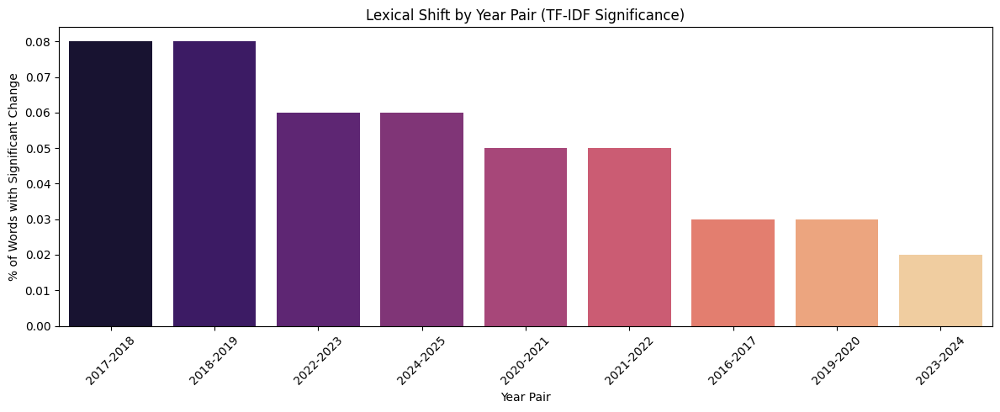

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(12, 5))
sns.barplot(data=most_volatile_years, x='Year Pair', y='% Significant', palette='magma')
plt.title('Lexical Shift by Year Pair (TF-IDF Significance)')
plt.ylabel('% of Words with Significant Change')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [24]:
# identify the words that drove the biggest shift in the 2024-2025 year-pair.

# Set the year-pair of interest
top_yearpair = '2024-2025'
print(f"Most lexical shift occurred in: {top_yearpair}")

# Pull the full test results for that year-pair
top_df = all_term_tests[top_yearpair].copy()

# Filter to significant words only
sig_words_df = top_df[top_df['significant'] == True]

# Sort and display the top 20 by lowest p-value
top_words = sig_words_df.sort_values('p_corrected').head(20)
top_words[['term', 'p_corrected', 'U_statistic']]

Most lexical shift occurred in: 2024-2025


,term,p_corrected,U_statistic
15317,underrepresented,5.955697e-18,710654.0
13855,fellowship,5.956894e-11,585952.0
711,fy,4.507242e-10,591357.0
11575,sponsoring,3.022369e-09,591740.5
12315,fellowships,3.022369e-09,591740.5
11754,minority,2.603228e-07,657199.0
11066,climate,2.555720e-05,662765.5
20207,title,6.780147e-05,592096.0
1231,diverse,2.066802e-04,675669.0
3577,national,3.082712e-04,672227.5


/var/folders/ms/yvnygwhs3jq6kw556d3s72lc0000gn/T/ipykernel_35452/3051254780.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_words, y='term', x='-log10(p)', palette='viridis')


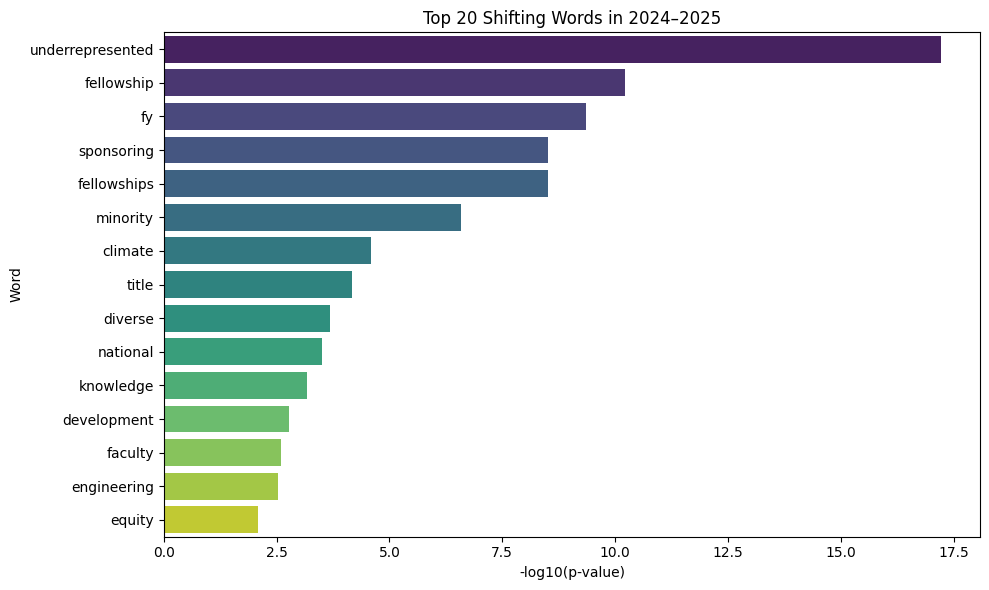

In [25]:
# Convert p-values to -log10(p)
top_words['-log10(p)'] = -np.log10(top_words['p_corrected'])

plt.figure(figsize=(10, 6))
sns.barplot(data=top_words, y='term', x='-log10(p)', palette='viridis')
plt.title('Top 20 Shifting Words in 2024–2025')
plt.xlabel('-log10(p-value)')
plt.ylabel('Word')
plt.tight_layout()
plt.show()

In [26]:
## NOTE I think it is worth see what these look with lemmatization corrected for plurals

In [27]:
# Now Testing Variance in Lexical Change Across Year-Pairs

In [28]:
# kruskal wallis test for anova versus levene
from scipy.stats import kruskal

grouped_Ustats = [df['U_statistic'] for df in all_term_tests.values()]
stat, p = kruskal(*grouped_Ustats)
print(f"Kruskal-Wallis test statistic: {stat}, p-value: {p}")

Kruskal-Wallis test statistic: 266049.9681198906, p-value: 0.0


In [29]:
# levene Variance in change across years
from scipy.stats import levene

# Example: Compare variance of U-statistics for each year-pair
levene_result = levene(*[df['U_statistic'].values for df in all_term_tests.values()])
print(levene_result)

LeveneResult(statistic=34.77735474964543, pvalue=1.8911034787014193e-55)


/var/folders/ms/yvnygwhs3jq6kw556d3s72lc0000gn/T/ipykernel_35452/1793032114.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=variance_df, x='Year Pair', y='U_stat_variance', palette='viridis')


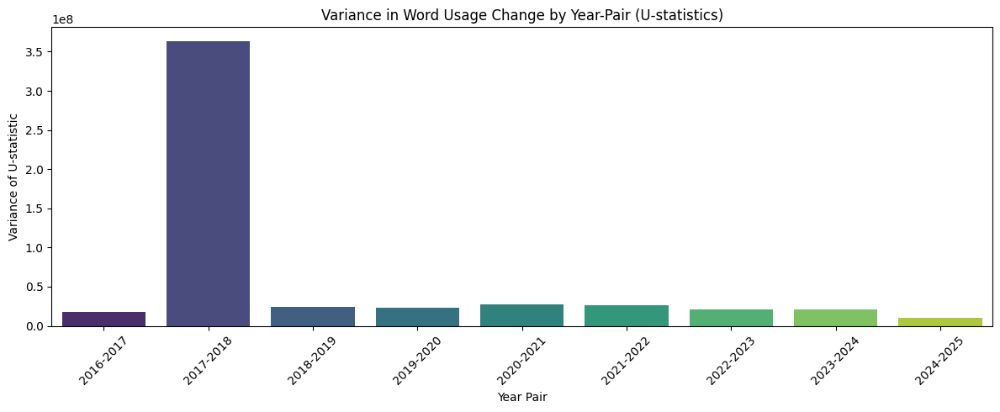

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Collect variance of U-statistics per year-pair
variance_df = pd.DataFrame([
    {
        'Year Pair': year_pair,
        'U_stat_variance': df['U_statistic'].var()
    }
    for year_pair, df in all_term_tests.items()
])

# Plot
plt.figure(figsize=(12, 5))
sns.barplot(data=variance_df, x='Year Pair', y='U_stat_variance', palette='viridis')
plt.title('Variance in Word Usage Change by Year-Pair (U-statistics)')
plt.ylabel('Variance of U-statistic')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/var/folders/ms/yvnygwhs3jq6kw556d3s72lc0000gn/T/ipykernel_35452/4023304353.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=most_volatile_years, x='Year Pair', y='% Significant', palette='magma')


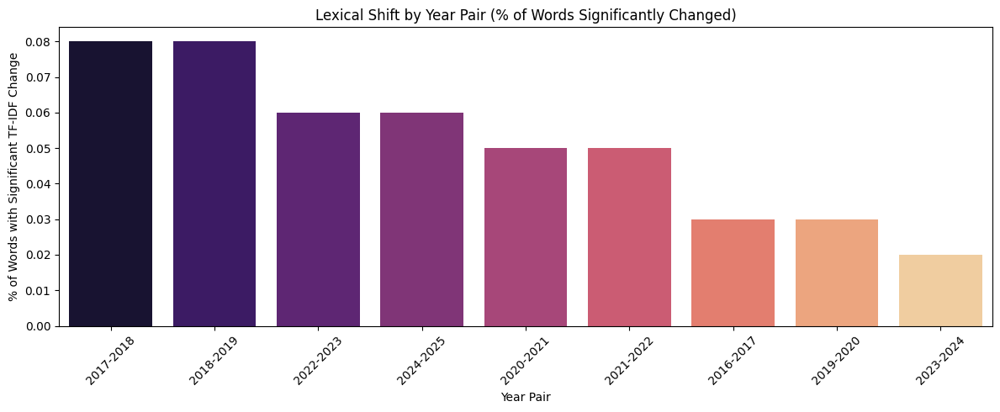

In [31]:
# Assumes you already calculated most_volatile_years with "% Significant"
plt.figure(figsize=(12, 5))
sns.barplot(data=most_volatile_years, x='Year Pair', y='% Significant', palette='magma')
plt.title('Lexical Shift by Year Pair (% of Words Significantly Changed)')
plt.ylabel('% of Words with Significant TF-IDF Change')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [32]:
## NOTE TF-IDF score comparison leaves out context, which is why we whould check for semantic meaning and then test all the differences

/var/folders/ms/yvnygwhs3jq6kw556d3s72lc0000gn/T/ipykernel_35452/491408697.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=u_stats_df, x='year_pair', y='U_statistic', palette='viridis')


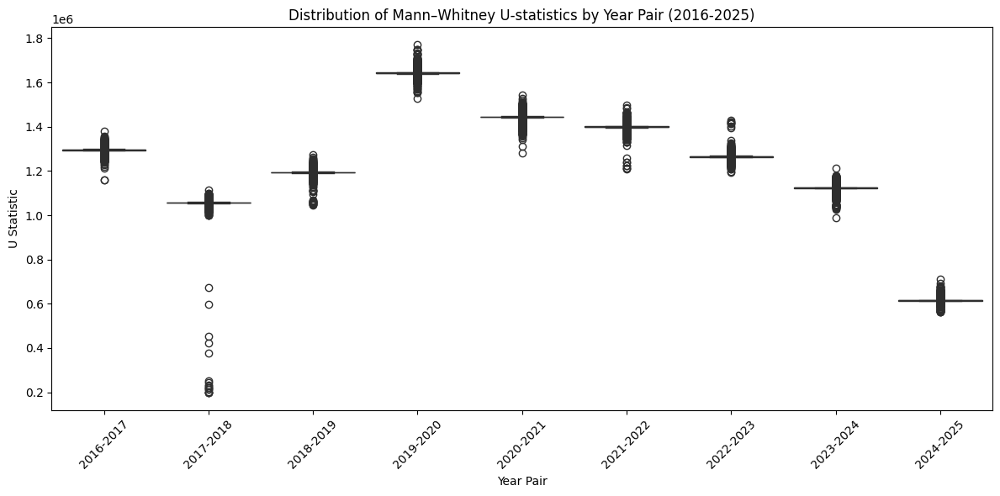

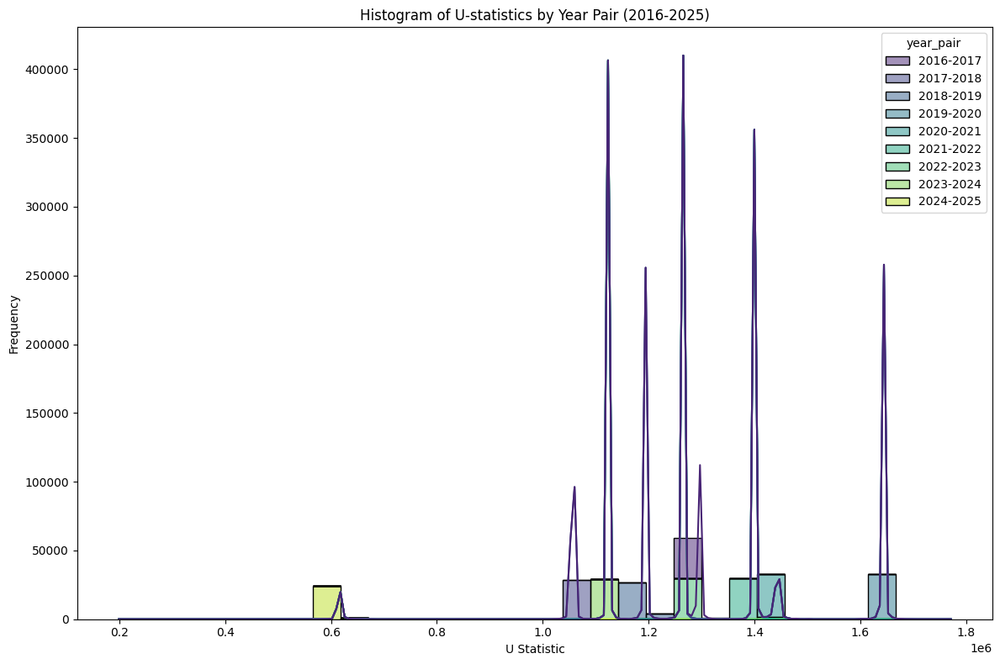

In [33]:
# ----- Step 1: Combine U-statistics for all year pairs into one DataFrame -----
# all_term_tests should be a dictionary like:
# {
#    "2016-2017": df_for_2016_2017,
#    "2017-2018": df_for_2017_2018,
#    ...
#    "2024-2025": df_for_2024_2025
# }
# Each df is assumed to have a column "U_statistic".

u_stats_list = []
# Loop through all the desired year-pairs (make sure the keys are correct)
for year_pair in sorted(all_term_tests.keys()):
    # Only include the keys corresponding to years 2016 to 2025
    # (e.g., "2016-2017", "2017-2018", … "2024-2025")
    if year_pair.startswith("2016") or year_pair.startswith("2017") or \
       year_pair.startswith("2018") or year_pair.startswith("2019") or \
       year_pair.startswith("2020") or year_pair.startswith("2021") or \
       year_pair.startswith("2022") or year_pair.startswith("2023") or \
       year_pair.startswith("2024"):
        df_temp = all_term_tests[year_pair].copy()
        df_temp['year_pair'] = year_pair  # add the year-pair as a column
        # Ensure we're only taking the U_statistic (and any other columns you want)
        u_stats_list.append(df_temp[['year_pair', 'U_statistic']])

# Concatenate the results
u_stats_df = pd.concat(u_stats_list, ignore_index=True)

# ----- Step 2: Visualize the distributions using a Boxplot -----
plt.figure(figsize=(12, 6))
sns.boxplot(data=u_stats_df, x='year_pair', y='U_statistic', palette='viridis')
plt.title('Distribution of Mann–Whitney U-statistics by Year Pair (2016-2025)')
plt.xlabel('Year Pair')
plt.ylabel('U Statistic')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ----- Optional Step 3: Visualize with Histograms for each Year Pair -----
plt.figure(figsize=(12, 8))
sns.histplot(data=u_stats_df, x='U_statistic', hue='year_pair', bins=30, kde=True, multiple="stack", palette='viridis')
plt.title('Histogram of U-statistics by Year Pair (2016-2025)')
plt.xlabel('U Statistic')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


## LDA Topic Modeling - Topic Modeling By Year

In [34]:
abstracts_by_year = {
    year: df['Abstract'].dropna().tolist()
    for year, df in awards_data.items()
}

In [35]:
for year, abstracts in abstracts_by_year.items():
    print(f"{year}: {len(abstracts)} abstracts")

print(abstracts_by_year.keys())



2016: 1592 abstracts
2017: 1627 abstracts
2018: 1299 abstracts
2019: 1837 abstracts
2020: 1789 abstracts
2021: 1614 abstracts
2022: 1735 abstracts
2023: 1458 abstracts
2024: 1542 abstracts
2025: 797 abstracts
dict_keys(['2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024', '2025'])


In [36]:
for abstract in abstracts_by_year['2025'][:5]:
    print(abstract, '\n')

<br/>This award reflects NSF's statutory mission and has been deemed worthy of support through evaluation using the Foundation's intellectual merit and broader impacts review criteria. and the sponsoring scientist is Ben Green.luding applications to other disciplines, under the mentorship of a sponsoring scientist.

<br/>This award reflects NSF's statutory mission and has been deemed worthy of support through evaluation using the Foundation's intellectual merit and broader impacts review criteria. eedback. To advance the field, the project will (1) develop robust algorithms for ranking that account for ill-conditioned sampling mechanisms and relax parametric modeling assumptions; (2) propose new estimation and uncertainty quantification methods for user-item ratings that work effectively in sparse and heterogeneous settings; and (3) introduce novel frameworks for reinforcement learning that incorporate ?out-of-list? preference feedback while addressing the issue of distribution shifts.

In [37]:
from gensim.models import Word2Vec

# Tokenize abstracts per year
tokenized_abstracts_by_year = {
    year: [word_tokenize_manual(abstract.lower()) for abstract in abstracts]
    for year, abstracts in abstracts_by_year.items()
}



/Users/ryanseely/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [38]:
# Train one model per year
w2v_models = {}
for year, tokens in tokenized_abstracts_by_year.items():
    model = Word2Vec(sentences=tokens, vector_size=100, window=5, min_count=5, workers=4, seed=42)
    w2v_models[year] = model

In [39]:
from scipy.spatial.distance import cosine

def cosine_shift(word, year1, year2):
    vec1 = w2v_models[year1].wv[word]
    vec2 = w2v_models[year2].wv[word]
    return cosine(vec1, vec2)

# Example usage
cosine_shift('reu', '2016', '2024')

0.9406869036970006

In [40]:
# LDA TOPIC MODELING BY YEAR

from gensim import corpora, models
from collections import defaultdict


lda_models = {}
dictionaries = {}

for year, texts in abstracts_by_year.items():
    # Tokenize and lowercase
    tokenized = [word_tokenize_manual(text.lower()) for text in texts]

    # Create dictionary and filter out extremes
    dictionary = corpora.Dictionary(tokenized)
    dictionary.filter_extremes(no_below=3, no_above=0.5)
    corpus = [dictionary.doc2bow(doc) for doc in tokenized]

    # Skip if not enough data
    if len(corpus) < 10 or len(dictionary) < 10:
        continue

    # Train LDA model
    lda = models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, passes=10, random_state=42)
    lda_models[year] = lda
    dictionaries[year] = dictionary

In [41]:
for year, lda in lda_models.items():
    print(f"\nTopics for {year}:")
    for i, topic in lda.print_topics(num_words=10):
        print(f"  Topic {i}: {topic}")


Topics for 2016:
  Topic 0: 0.008*"materials" + 0.006*"energy" + 0.005*"properties" + 0.005*"or" + 0.004*"such" + 0.004*"using" + 0.004*"pi" + 0.004*"high" + 0.004*"used" + 0.004*"surface"
  Topic 1: 0.007*"how" + 0.006*"cell" + 0.006*"it" + 0.006*"cells" + 0.004*"between" + 0.004*"understanding" + 0.004*"provide" + 0.003*"into" + 0.003*"they" + 0.003*"data"
  Topic 2: 0.012*"conference" + 0.007*"researchers" + 0.007*"program" + 0.006*"theory" + 0.006*"workshop" + 0.006*"science" + 0.006*"graduate" + 0.006*"participants" + 0.005*"university" + 0.005*";"
  Topic 3: 0.013*"species" + 0.006*"genetic" + 0.005*"data" + 0.005*"populations" + 0.005*"how" + 0.005*"through" + 0.004*"between" + 0.004*"or" + 0.004*"understanding" + 0.004*"two"
  Topic 4: 0.009*"data" + 0.006*"how" + 0.005*"systems" + 0.005*"has" + 0.004*"it" + 0.004*"information" + 0.004*"such" + 0.004*"or" + 0.004*"use" + 0.004*"understanding"
  Topic 5: 0.009*"stem" + 0.006*";" + 0.006*"how" + 0.006*"science" + 0.006*"through"

In [42]:
%pip install pyLDAvis

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [43]:
import pyLDAvis.gensim_models
import pyLDAvis

year = '2024'
lda = lda_models[year]
dictionary = dictionaries[year]

# Tokenize documents again
tokenized = [word_tokenize_manual(doc.lower()) for doc in abstracts_by_year[year]]
corpus = [dictionary.doc2bow(doc) for doc in tokenized]

# Visualize
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda, corpus, dictionary)     

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.093351  0.099945       1        1  15.635410
9     -0.068603 -0.050022       2        1  14.778334
3      0.051002 -0.067116       3        1  13.421609
2     -0.015576 -0.060271       4        1  13.231733
7     -0.095589 -0.033236       5        1   9.268387
5     -0.025407  0.099318       6        1   8.836037
0      0.091989 -0.043011       7        1   7.547797
8      0.082261  0.013126       8        1   6.125863
6     -0.017598 -0.063204       9        1   5.897412
4      0.090872  0.104470      10        1   5.257417, topic_info=            Term         Freq        Total Category  logprob  loglift
1147  conference   499.000000   499.000000  Default  30.0000  30.0000
121         data  1663.000000  1663.000000  Default  29.0000  29.0000
776         stem   778.000000   778.000000  Default  28.0000  28.0000
851      quantum   466.000000   466.000000  Default  27.0000  27.0000
3197      engine   193.000000   193.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
728          how    58.611697  1370.591808  Topic10  -5.7227  -0.2065
79       science    55.598733  1163.757699  Topic10  -5.7755  -0.0957
97    university    51.997111   652.054348  Topic10  -5.8425   0.4166
4           also    54.172227  1099.469006  Topic10  -5.8015  -0.0649
43          into    52.450943   882.571639  Topic10  -5.8338   0.1226

[861 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
2991      1  0.016686            $
2991      2  0.166860            $
2991      3  0.183547            $
2991      4  0.016686            $
2991      5  0.016686            $
...     ...       ...          ...
326       3  0.119438         zone
326       4  0.119438         zone
326       6  0.047775         zone
326       7  0.621079         zone
5519      1  0.912931  zooplankton

[3216 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 10, 4, 3, 8, 6, 1, 9, 7, 5])

In [44]:
def compare_topics_by_words(lda1, lda2, num_words=10):
    sim_matrix = []
    for i, topic1 in lda1.show_topics(num_words=num_words, formatted=False):
        topic1_words = set([w for w, _ in topic1])
        row = []
        for j, topic2 in lda2.show_topics(num_words=num_words, formatted=False):
            topic2_words = set([w for w, _ in topic2])
            overlap = len(topic1_words & topic2_words) / num_words
            row.append(overlap)
        sim_matrix.append(row)
    return sim_matrix

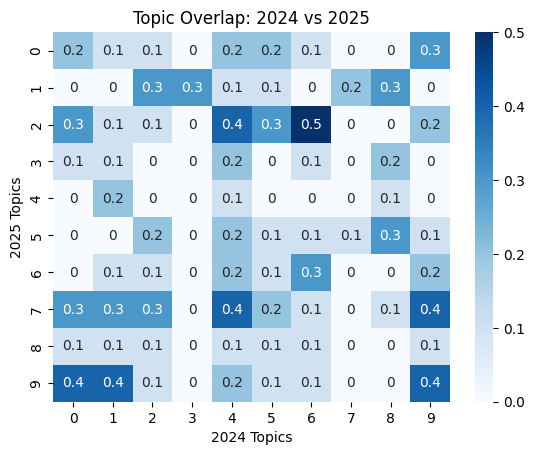

In [45]:
similarities = compare_topics_by_words(lda_models['2024'], lda_models['2025'])
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(similarities, annot=True, cmap='Blues')
plt.title('Topic Overlap: 2024 vs 2025')
plt.xlabel('2024 Topics')
plt.ylabel('2025 Topics')
plt.show()

In [46]:
for i, topic in lda_models['2024'].show_topics(num_topics=10, num_words=8, formatted=False):
    print(f"2024 Topic {i}: {[word for word, _ in topic]}")

for i, topic in lda_models['2025'].show_topics(num_topics=10, num_words=8, formatted=False):
    print(f"2025 Topic {i}: {[word for word, _ in topic]}")

2024 Topic 0: ['model', 'data', 'climate', 'water', '?', 'models', 'understanding', 'flow']
2024 Topic 1: ['conference', 'program', '?', 'science', 'researchers', 'participants', ':', 'university']
2024 Topic 2: ['how', '?', 'understanding', 'or', 'such', 'design', 'human', 'into']
2024 Topic 3: ['materials', 'quantum', 'energy', 'such', '?', 'properties', 'high', 'chemistry']
2024 Topic 4: ['?', 'engine', 'energy', 's', 'manufacturing', 'innovation', 'region', 'economic']
2024 Topic 5: ['stem', 'program', '?', 'education', 'community', 'science', 'how', 'institutions']
2024 Topic 6: ['systems', 'cell', 'control', 'cells', 'system', 'how', 'molecular', 'materials']
2024 Topic 7: ['data', 'learning', '?', 'how', 'language', 'algorithms', 'models', 'science']
2024 Topic 8: ['carbon', 'climate', 'change', '?', 'soil', 'technology', 'changes', 'how']
2024 Topic 9: ['data', 'systems', 'learning', '?', 'design', 'such', 'technology', 'ai']
2025 Topic 0: ['data', 'it', 'technology', 'power', 

## LDA Topic Modeling - Topics Across Years


In [47]:
# Combine all abstracts into one list
from gensim.models import LdaModel

all_abstracts = [abstract for texts in abstracts_by_year.values() for abstract in texts]

tokenized_all = [word_tokenize_manual(text.lower()) for text in all_abstracts]

global_dictionary = corpora.Dictionary(tokenized_all)
global_dictionary.filter_extremes(no_below=5, no_above=0.5)
global_corpus = [global_dictionary.doc2bow(doc) for doc in tokenized_all]

global_lda = LdaModel(
    corpus=global_corpus,
    id2word=global_dictionary,
    num_topics=10,
    passes=10,
    random_state=42
)

In [48]:
global_topic_dists_by_year = {}

for year, texts in abstracts_by_year.items():
    tokenized = [word_tokenize_manual(text.lower()) for text in texts]
    bow_docs = [global_dictionary.doc2bow(doc) for doc in tokenized]
    
    # Get topic distributions
    topic_dists = [global_lda.get_document_topics(bow, minimum_probability=0) for bow in bow_docs]
    
    # Average across documents
    avg_dist = [sum(prob for _, prob in topics) / len(topics) if topics else 0
                for topics in zip(*topic_dists)]
    
    global_topic_dists_by_year[year] = avg_dist

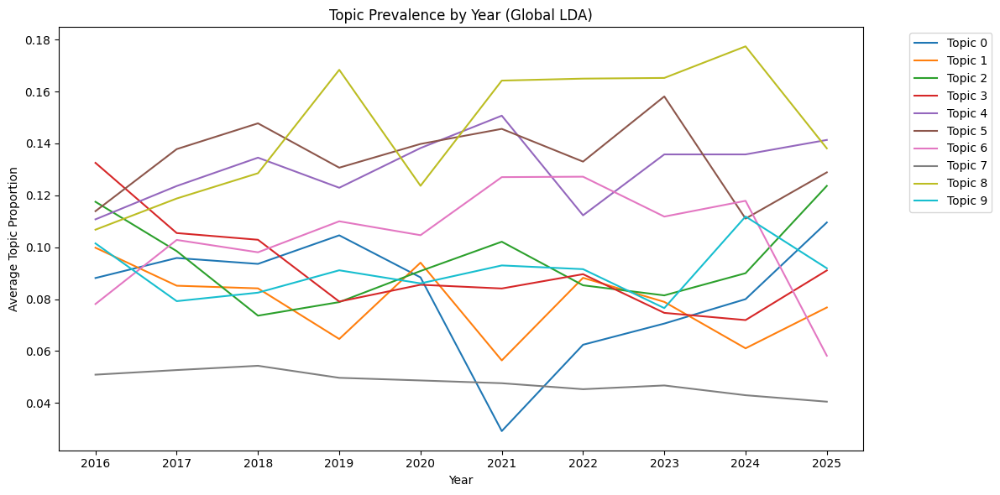

In [49]:
import matplotlib.pyplot as plt

years_sorted = sorted(global_topic_dists_by_year.keys())
num_topics = global_lda.num_topics

# Build matrix: rows = years, cols = topics
topic_matrix = [[global_topic_dists_by_year[year][k] for k in range(num_topics)] for year in years_sorted]

# Plot
plt.figure(figsize=(12, 6))
for topic_idx in range(num_topics):
    topic_values = [year_dist[topic_idx] for year_dist in topic_matrix]
    plt.plot(years_sorted, topic_values, label=f"Topic {topic_idx}")
    
plt.title("Topic Prevalence by Year (Global LDA)")
plt.xlabel("Year")
plt.ylabel("Average Topic Proportion")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [50]:
for topic_id in range(global_lda.num_topics):
    words = global_lda.show_topic(topic_id, topn=10)
    print(f"Topic {topic_id}: " + ", ".join([word for word, _ in words]))

Topic 0: conference, researchers, workshop, field, participants, :, university, international, theory, graduate
Topic 1: ocean, ?, earth, processes, data, ice, carbon, understanding, climate, surface
Topic 2: how, cells, cell, ?, biological, understanding, molecular, brain, biology, or
Topic 3: water, environmental, how, species, climate, change, ?, data, communities, understanding
Topic 4: data, such, quantum, models, computational, methods, systems, learning, theory, algorithms
Topic 5: how, ?, data, social, or, use, language, about, it, they
Topic 6: stem, education, science, program, engineering, teachers, learning, development, ?, school
Topic 7: program, reu, site, university, projects, training, scientific, participants, experience, summer
Topic 8: systems, technology, system, design, data, development, potential, such, proposed, applications
Topic 9: materials, energy, properties, chemical, ?, chemistry, high, material, design, manufacturing


In [51]:
topic_keywords = {
    topic_id: [word for word, _ in global_lda.show_topic(topic_id, topn=5)]
    for topic_id in range(global_lda.num_topics)
}

for k, v in topic_keywords.items():
    print(f"Topic {k}: {', '.join(v)}")

Topic 0: conference, researchers, workshop, field, participants
Topic 1: ocean, ?, earth, processes, data
Topic 2: how, cells, cell, ?, biological
Topic 3: water, environmental, how, species, climate
Topic 4: data, such, quantum, models, computational
Topic 5: how, ?, data, social, or
Topic 6: stem, education, science, program, engineering
Topic 7: program, reu, site, university, projects
Topic 8: systems, technology, system, design, data
Topic 9: materials, energy, properties, chemical, ?


## BERTopic Modeling

In [52]:
from bertopic import BERTopic

# Combine abstracts from all years
all_abstracts = [abstract for texts in abstracts_by_year.values() for abstract in texts]

# Fit model
topic_model = BERTopic(language="english")
topics, probs = topic_model.fit_transform(all_abstracts)

/Users/ryanseely/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [53]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,5363,-1_and_of_the_to,"[and, of, the, to, in, will, for, this, that, is]",[This project aims to serve the national inter...
1,0,224,0_teachers_stem_noyce_highneed,"[teachers, stem, noyce, highneed, teacher, dis...",[With support from the Robert Noyce Teacher Sc...
2,1,208,1_sponsoring_fellowships_fellowship_institution,"[sponsoring, fellowships, fellowship, institut...",[This award is made as part of the FY 2019 Mat...
3,2,195,2_manufacturing_additive_alloys_materials,"[manufacturing, additive, alloys, materials, p...",[NON-TECHNICAL SUMMARY\r<br/>\r<br/>Additive m...
4,3,171,3_language_speech_languages_linguistic,"[language, speech, languages, linguistic, word...",[This project examines the perception of Engli...
...,...,...,...,...,...
266,265,10,265_species_ponds_shifts_abundanceoccupancy,"[species, ponds, shifts, abundanceoccupancy, r...",[The healthy functioning of natural ecosystems...
267,266,10,266_benthic_column_sediment_coastal,"[benthic, column, sediment, coastal, dic, sedi...",[In many coastal regions fertilizer washed dow...
268,267,10,267_childrens_children_stem_books,"[childrens, children, stem, books, preschool, ...","[The 4-year project, Supports for Science and ..."
269,268,10,268_ice_monoxide_methane_atmospheric,"[ice, monoxide, methane, atmospheric, measurem...",[Atmospheric gas records developed from polar ...


In [54]:
topic_model.reduce_topics(all_abstracts, nr_topics="auto")


In [55]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,5363,-1_and_the_of_to,"[and, the, of, to, in, will, for, this, that, is]",[This Faculty Early Career Development Program...
1,0,625,0_ocean_carbon_marine_climate,"[ocean, carbon, marine, climate, the, coastal,...",[The Southern Ocean is often referred to as th...
2,1,505,1_stem_teachers_noyce_highneed,"[stem, teachers, noyce, highneed, teacher, tea...",[This project aims to serve the national inter...
3,2,496,2_plant_species_plants_genetic,"[plant, species, plants, genetic, in, will, ho...",[Heat waves are impairing global forest produc...
4,3,452,3_reu_students_program_site,"[reu, students, program, site, research, parti...",[This REU Site award to Alabama State Universi...
...,...,...,...,...,...
169,168,10,168_childrens_stem_children_books,"[childrens, stem, children, books, preschool, ...","[The 4-year project, Supports for Science and ..."
170,169,10,169_hate_social_online_media,"[hate, social, online, media, content, moderat...",[This research examines the causes and consequ...
171,170,10,170_projectbased_learning_platform_sbir,"[projectbased, learning, platform, sbir, feedb...",[The broader impact of this Small Business Inn...
172,171,10,171_species_ponds_shifts_abundanceoccupancy,"[species, ponds, shifts, abundanceoccupancy, r...",[The healthy functioning of natural ecosystems...


These topics contain a lot of stopwords. So, we will keep stopwords in to make the embeddings, but not to make the topics

In [56]:
# Step 1: Raw text for embeddings
raw_texts = all_abstracts  # full context

# Step 2: Cleaned text for vectorization (labels only)
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from nltk import download
import re

download('stopwords')
stop_words = stopwords.words('english')

def clean_for_vectorizer(text):
    return re.sub(r'\b(' + '|'.join(stop_words) + r')\b', '', text.lower())

cleaned_texts = [clean_for_vectorizer(t) for t in raw_texts]

# Step 3: Use BERTopic
vectorizer_model = CountVectorizer()
topic_model = BERTopic(vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(raw_texts)  # Raw for clustering

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ryanseely/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [57]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,5351,-1_and_of_the_to,"[and, of, the, to, in, will, for, this, that, is]",[Strategies for Learning: Augmented Reality an...
1,0,212,0_manufacturing_additive_alloys_materials,"[manufacturing, additive, alloys, materials, p...",[This SBIR Phase II project will address the l...
2,1,206,1_sponsoring_fellowships_fellowship_institution,"[sponsoring, fellowships, fellowship, institut...",[This award is made as part of the FY 2019 Mat...
3,2,181,2_teachers_stem_highneed_noyce,"[teachers, stem, highneed, noyce, teacher, tea...",[The project aims to serve the national need o...
4,3,177,3_language_speech_languages_linguistic,"[language, speech, languages, linguistic, spea...",[This doctoral dissertation project examines h...
...,...,...,...,...,...
262,261,10,261_mantle_rocks_zones_seismic,"[mantle, rocks, zones, seismic, flow, subducti...",[Subduction zones are locations where one tect...
263,262,10,262_randomness_random_bits_pseudorandomness,"[randomness, random, bits, pseudorandomness, c...",[One of the most successful paradigms in compu...
264,263,10,263_hate_online_social_media,"[hate, online, social, media, content, moderat...",[This research examines the causes and consequ...
265,264,10,264_teacher_teachers_cs_highneed,"[teacher, teachers, cs, highneed, video, reten...",[The project will serve the national need to d...


In [58]:
topic_model.visualize_topics()


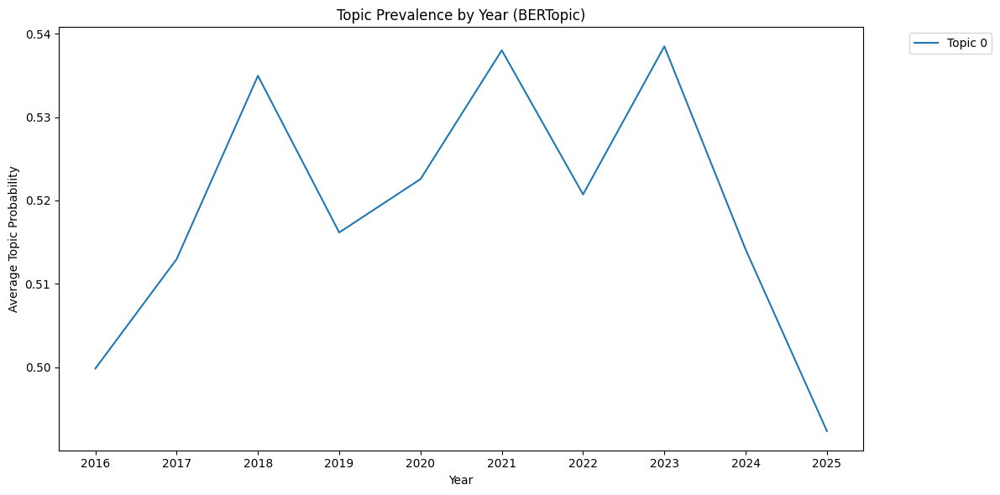

In [59]:
# Get topic distribution for each abstract
_, probs = topic_model.transform(raw_texts)

# Assign years to each abstract
years = []
for year, abstracts in abstracts_by_year.items():
    years.extend([year] * len(abstracts))

# Build dataframe
import pandas as pd
import numpy as np

df = pd.DataFrame(probs)
df['year'] = years

# Average topic probability per year
topic_trends = df.groupby('year').mean().sort_index()

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for topic_id in topic_trends.columns:
    plt.plot(topic_trends.index, topic_trends[topic_id], label=f'Topic {topic_id}')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Topic Prevalence by Year (BERTopic)')
plt.xlabel('Year')
plt.ylabel('Average Topic Probability')
plt.tight_layout()
plt.show()


In [62]:
topic_model.get_topic_info().head(20)  # Top 20 most frequent


,Topic,Count,Name,Representation,Representative_Docs
0,-1,5351,-1_and_of_the_to,"[and, of, the, to, in, will, for, this, that, is]",[Strategies for Learning: Augmented Reality an...
1,0,212,0_manufacturing_additive_alloys_materials,"[manufacturing, additive, alloys, materials, p...",[This SBIR Phase II project will address the l...
2,1,206,1_sponsoring_fellowships_fellowship_institution,"[sponsoring, fellowships, fellowship, institut...",[This award is made as part of the FY 2019 Mat...
3,2,181,2_teachers_stem_highneed_noyce,"[teachers, stem, highneed, noyce, teacher, tea...",[The project aims to serve the national need o...
4,3,177,3_language_speech_languages_linguistic,"[language, speech, languages, linguistic, spea...",[This doctoral dissertation project examines h...
5,4,166,4_catalysts_catalysis_catalytic_reactions,"[catalysts, catalysis, catalytic, reactions, c...",[With the support of the Chemical Catalysis pr...
6,5,155,5_plant_plants_genes_crop,"[plant, plants, genes, crop, gene, genetic, ma...",[Plant researchers and breeders agree that tec...
7,6,152,6_conference_travel_attend_ieee,"[conference, travel, attend, ieee, acm, intern...",[The IEEE International Conference on Computer...
8,7,127,7_program_reu_students_biology,"[program, reu, students, biology, 10, dr, cont...",[This REU Site award to the Marine Biological ...
9,8,120,8_solar_space_plasma_weather,"[solar, space, plasma, weather, ionosphere, ma...",[Understanding the close interconnection betwe...


In [119]:
## TRYING THE BERTOPIC MODEL AGAIN BUT WITH SEMANTIC EMBEDDINGS

from sentence_transformers import SentenceTransformer
from bertopic import BERTopic

# Step 1: Create embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Step 2: Run BERTopic using semantic embeddings
topic_model_semantic = BERTopic(embedding_model=embedding_model)
topics, probs = topic_model_semantic.fit_transform(raw_texts)

In [120]:
topic_model_semantic.save("bertopic_semantic_model")

2025-07-23 03:21:22,990 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [121]:
topic_model_semantic.get_topic_info().count()

Topic                  266
Count                  266
Name                   266
Representation         266
Representative_Docs    266
dtype: int64

In [122]:
# Step 1: Generate topics over time data
topics_over_time = topic_model_semantic.topics_over_time(
    raw_texts,       # your list of full documents
    timestamps=years # a list of same length with datetime or year info
)

# Step 2: Visualize
topic_model_semantic.visualize_topics_over_time(topics_over_time)

In [123]:
topics_over_time

,Topic,Words,Frequency,Timestamp,Name
0,-1,"the, of, to, and, in",587,2016-01-01,-1_and_the_of_to
1,0,"noyce, teacher, teachers, stem, teaching",25,2016-01-01,0_teachers_stem_noyce_teacher
2,1,"grfp, fellowship, sponsoring, fellowships, ins...",2,2016-01-01,1_sponsoring_fellowships_fellowship_scie...
3,2,"mantle, magma, volcanic, subduction, arc",33,2016-01-01,2_mantle_magma_volcanic_subduction
4,3,"manufacturing, additive, microstructure, mater...",18,2016-01-01,3_manufacturing_additive_alloys_printing
...,...,...,...,...,...
2189,248,"cyt, biogenesis, ii, heme, ccsb",1,2025-01-01,248_photosynthetic_cyt_cyanobacterium_li...
2190,255,"noncommutative, operator, theory, algebras, al...",1,2025-01-01,255_operator_algebras_noncommutative_the...
2191,258,"bots, bot, personas, influence, casa",1,2025-01-01,258_hate_online_social_content
2192,263,"counties, food, financial, organizational, out...",1,2025-01-01,263_food_territory_organizations_urban


In [124]:
import plotly.io as pio
pio.renderers.default = "notebook" 

In [125]:
topic_model_semantic.visualize_topics_over_time(
    topics_over_time,
    top_n_topics=10
)

In [ ]:
# still so many topics, we need to reduce for it to be valuable...but how!

In [126]:
fig = topic_model_semantic.visualize_hierarchy()
fig.show()

In [106]:
# Let's aggregate based on the dendrogram, which comes from the semantic vectors representing each topic




In [127]:
topic_model_semantic.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,5244,-1_and_the_of_to,"[and, the, of, to, in, will, this, for, br, is]",[This Research Experiences for Undergraduates ...
1,0,228,0_teachers_stem_noyce_teacher,"[teachers, stem, noyce, teacher, districts, ne...",[This project aims to serve the national need ...
2,1,206,1_sponsoring_fellowships_fellowship_scientist,"[sponsoring, fellowships, fellowship, scientis...",[This award is made as part of the FY 2020 Mat...
3,2,175,2_mantle_magma_volcanic_subduction,"[mantle, magma, volcanic, subduction, earth, e...",[The subduction of oceanic plates at deep-sea ...
4,3,168,3_manufacturing_additive_alloys_printing,"[manufacturing, additive, alloys, printing, ma...",[Smart Manufacturing strives to monitor every ...
...,...,...,...,...,...
261,260,11,260_reu_utep_harvard_students,"[reu, utep, harvard, students, site, program, ...",[This award is funded in whole or in part unde...
262,261,10,261_combinatorics_algebraic_combinatorial_caac,"[combinatorics, algebraic, combinatorial, caac...",[The 21st Annual Combinatorial Algebra meets A...
263,262,10,262_spatial_data_mpi_amc,"[spatial, data, mpi, amc, scale, point, spatio...","[Geospatial datasets are growing in volume, co..."
264,263,10,263_food_territory_organizations_urban,"[food, territory, organizations, urban, securi...",[This planning award supports the development ...


In [138]:
from scipy.cluster.hierarchy import fcluster

# Set a threshold based on your original dendrogram's `color_threshold=1.3`
threshold = 1.0
clusters = fcluster(Z, t=threshold, criterion='distance')

In [139]:
from collections import defaultdict

# Create dictionary: {cluster_id: [topic names]}
clustered_topics = defaultdict(list)

for label, cluster_id in zip(topic_info["Name"].values, clusters):
    clustered_topics[cluster_id].append(label)

In [140]:
for group_id, topics in clustered_topics.items():
    print(f"\nAggregated Topic {group_id} ({len(topics)} topics):")
    for t in topics:
        print(f" - {t}")


Aggregated Topic 18 (9 topics):
 - 0_teachers_stem_noyce_teacher
 - 53_income_scholarships_stem_graduation
 - 76_stem_hsi_hsis_hispanic
 - 112_indigenous_native_tribal_indian
 - 182_stem_youth_informal_learning
 - 213_agep_bi_institutional_equity
 - 219_cass_societies_saber_inclusion
 - 231_rd_teams_guam_statewide
 - 257_stem_grit_black_male

Aggregated Topic 23 (12 topics):
 - 1_sponsoring_fellowships_fellowship_scientist
 - 15_topology_geometry_geometric_conference
 - 25_mathematical_mathematics_reu_students
 - 27_number_automorphic_theory_forms
 - 44_algebraic_geometry_commutative_algebra
 - 56_combinatorics_graph_ramsey_conference
 - 80_algebras_theory_representation_quantum
 - 107_conference_mathematical_mathematics_glamp
 - 173_theory_axioms_infinity_structures
 - 176_harmonic_fourier_analysis_theory
 - 255_operator_algebras_noncommutative_theory
 - 261_combinatorics_algebraic_combinatorial_caac

Aggregated Topic 9 (7 topics):
 - 2_mantle_magma_volcanic_subduction
 - 75_instrume

In [141]:
# now rename topics according to new groups
# Get topic-term dictionary from BERTopic
topic_terms = topic_model_semantic.get_topics()  # {topic_id: [(word, score), ...]}

# Reverse map topic name -> topic_id
name_to_topic_id = dict(zip(topic_info["Name"], topic_info["Topic"]))

# Create renamed aggregated clusters
aggregated_topic_names = {}

for cluster_id, topic_names in clustered_topics.items():
    # Convert topic names to topic_ids
    topic_ids = [name_to_topic_id[name] for name in topic_names]
    
    # Collect top words across all topics in this cluster
    word_counter = defaultdict(float)
    for tid in topic_ids:
        for word, score in topic_terms.get(tid, []):
            word_counter[word] += score

    # Sort words by total score across topics
    top_words = sorted(word_counter.items(), key=lambda x: x[1], reverse=True)
    new_name = ", ".join([w for w, _ in top_words[:3]])  # top 3 words

    aggregated_topic_names[cluster_id] = new_name

In [142]:
for cluster_id, new_name in aggregated_topic_names.items():
    print(f"Aggregated Topic {cluster_id}: {new_name}")

Aggregated Topic 18: stem, cass, societies
Aggregated Topic 23: theory, conference, algebras
Aggregated Topic 9: earth, geotraces, isotopes
Aggregated Topic 34: glass, glasses, manufacturing
Aggregated Topic 24: social, language, media
Aggregated Topic 4: plant, plants, leaf
Aggregated Topic 33: polymer, polymers, ionic
Aggregated Topic 21: gravitational, astronomy, physics
Aggregated Topic 17: reu, site, students
Aggregated Topic 36: chiral, molecules, solar
Aggregated Topic 1: snail, archaeological, snails
Aggregated Topic 40: robot, robotics, underwater
Aggregated Topic 45: imaging, eye, glaucoma
Aggregated Topic 43: acoustic, mechanical, locomotion
Aggregated Topic 28: data, algorithms, spatial
Aggregated Topic 42: brain, neural, neurons
Aggregated Topic 25: legal, housing, health
Aggregated Topic 39: mercury, combustion, hg
Aggregated Topic 30: computing, cloud, memory
Aggregated Topic 19: engineering, teacher, teachers
Aggregated Topic 15: conference, satc, cybersecurity
Aggregat

In [149]:
topic_to_agg = dict(zip(topic_info["Topic"], topic_info["AggregatedTopic"]))  # or ["ClusterID"] or ["AggregatedTopicLabel"]

topics_over_time["AggregatedTopic"] = topics_over_time["Topic"].map(topic_to_agg)

agg_over_time = (
    topics_over_time
    .groupby(["AggregatedTopic", "Timestamp"])["Frequency"]
    .sum()
    .reset_index()
)


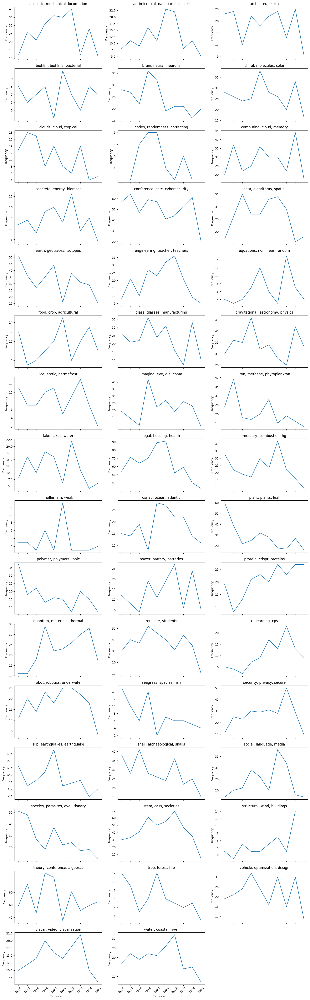

In [152]:
import math

topics = agg_over_time["AggregatedTopic"].unique()
n_cols = 3
n_rows = math.ceil(len(topics) / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows), sharex=True)
axs = axs.flatten()

for i, topic in enumerate(topics):
    sns.lineplot(
        data=agg_over_time[agg_over_time["AggregatedTopic"] == topic],
        x="Timestamp", y="Frequency", ax=axs[i]
    )
    axs[i].set_title(topic)
    axs[i].tick_params(axis='x', rotation=45)

# Remove unused axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

### Looking at significant drops from 2024 to 2025

In [153]:
# Filter for just 2024 and 2025
recent_years = agg_over_time[agg_over_time["Timestamp"].dt.year.isin([2024, 2025])]

# Pivot to compare frequencies side-by-side
pivoted = recent_years.pivot_table(
    index="AggregatedTopic",
    columns=recent_years["Timestamp"].dt.year,
    values="Frequency",
    fill_value=0
).reset_index()

pivoted.columns.name = None  # remove multi-index name if needed
pivoted.rename(columns={2024: "Freq_2024", 2025: "Freq_2025"}, inplace=True)

In [157]:
# Set a percent-drop threshold (e.g., 50% drop)
percent_drop_threshold = 0.5

# Only keep rows where 2024 freq > 0 to avoid division by zero
dropped_significantly = pivoted[
    (pivoted["Freq_2024"] > 0) & 
    ((pivoted["Freq_2025"] / pivoted["Freq_2024"]) < (1 - percent_drop_threshold))
].copy()

# Optional: Add a new column showing percentage drop
dropped_significantly["PercentDrop"] = (
    100 * (pivoted["Freq_2024"] - pivoted["Freq_2025"]) / pivoted["Freq_2024"]
).round(1)

# Sort and display
dropped_significantly = dropped_significantly.sort_values(by="PercentDrop", ascending=False)
display(dropped_significantly)

,AggregatedTopic,Freq_2024,Freq_2025,PercentDrop
41,"structural, wind, buildings",14.0,0.0,100.0
40,"stem, cass, societies",35.0,4.0,88.6
33,"robot, robotics, underwater",18.0,3.0,83.3
2,"arctic, reu, eloka",25.0,5.0,80.0
43,"tree, forest, fire",5.0,1.0,80.0
28,"power, battery, batteries",24.0,5.0,79.2
44,"vehicle, optimization, design",30.0,8.0,73.3
9,"concrete, energy, biomass",15.0,4.0,73.3
31,"reu, site, students",35.0,10.0,71.4
18,"ice, arctic, permafrost",7.0,2.0,71.4


### Looking at volatility/variance over time

In [165]:
topic_year_matrix = agg_over_time.pivot_table(
    index="AggregatedTopic",
    columns=agg_over_time["Timestamp"].dt.year,
    values="Frequency",
    fill_value=0
).sort_index(axis=1)

In [166]:
from scipy.spatial.distance import euclidean

years = topic_year_matrix.columns
volatility_scores = []

for i in range(1, len(years)):
    y1, y2 = years[i - 1], years[i]
    dist = euclidean(topic_year_matrix[y1], topic_year_matrix[y2])
    volatility_scores.append({
        "Year_Pair": f"{y1}-{y2}",
        "Volatility": dist
    })

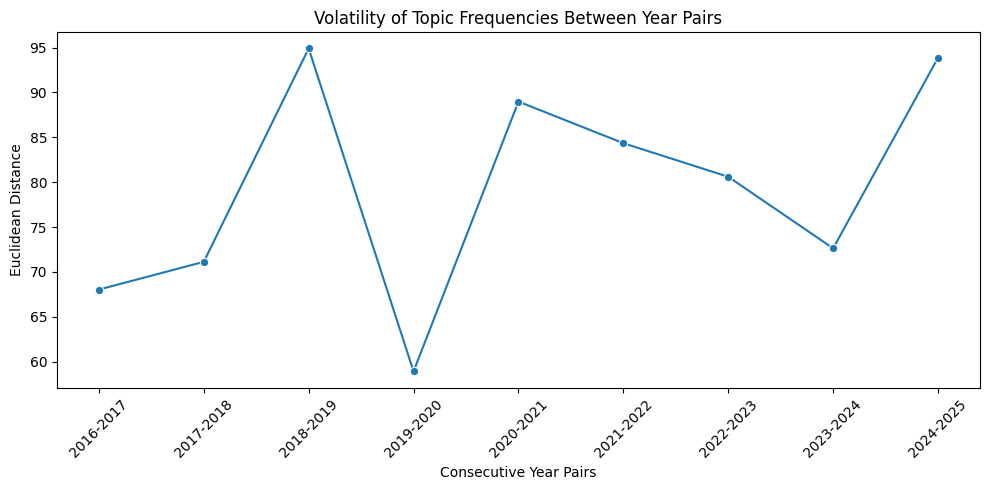

In [167]:
volatility_df = pd.DataFrame(volatility_scores)

plt.figure(figsize=(10, 5))
sns.lineplot(data=volatility_df, x="Year_Pair", y="Volatility", marker="o")
plt.title("Volatility of Topic Frequencies Between Year Pairs")
plt.ylabel("Euclidean Distance")
plt.xlabel("Consecutive Year Pairs")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
